# Transfert de style

- Mise en oeuvre inspirée de l'excellent tuto de tensorflow sur le [transfert de style](https://arxiv.org/abs/1508.06576)
--> Le transfert de style consiste à appliquer le 'style' d'une image sur le 'contenu' d'une autre. On peut 'capturer' le style de l'image à partir des corrélations de différentes cartes de caractéristiques du réseau convolutif via la matrice de Gram.
- C'est parti !! --> petit aperçu ci-dessous + bonus à la fin du notebook

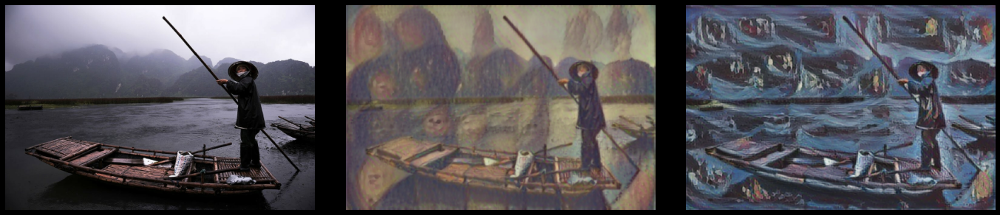

In [69]:
# Image originale à gauche...Tranfert de style à droite...

### Approche rapide 

In [1]:
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import PIL.Image
import numpy as np
import glob
import os

--> On commence par importer nos images de contenu et de styles

In [3]:
content_path = '/content/drive/MyDrive/Colab Notebooks/OPENCV/image_jpg/'
os.chdir(content_path)
content_names = glob.glob('*')

In [4]:
style_path = '/content/drive/MyDrive/Colab Notebooks/OPENCV/style_jpg/'
os.chdir(style_path)
style_names = glob.glob('*')

--> Fonctions de traitement et d'affichage

In [5]:
# Pour charger et traiter nos images:
def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  # fonction qui cast et normalise (les deux à la fois)
  img = tf.image.convert_image_dtype(img, tf.float32)

  # shape h*w seulement, et cast pour le 'scale'
  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  # cast pour le format 'shape'
  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  # Rajoute la dimension du lot
  img = img[tf.newaxis, :]
  return img

In [6]:
# Pour afficher nos images:
def imshow(image, title=None):
  if len(image.shape) > 3:
    # Retirer la dimension du lot
    image = tf.squeeze(image, axis=0)
  plt.imshow(image)
  plt.axis('off')
  if title:
    plt.title(title)

In [7]:
# Idem avec PIL.Image (plus joli)
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

--> Import de nos images

In [8]:
# Liste de nos contenus et de nos styles
content_images = [load_img(content_path + name) for name in content_names]
style_images = [load_img(style_path + name) for name in style_names]

In [9]:
# Pour accéder à nos images par leur noms
name2content = {name.split('.')[0] : content for name, content in zip(content_names, content_images)}
name2style = {name.split('.')[0] : style for name, style in zip(style_names, style_images)}

--> Importation du modèle et transfert de style

In [10]:
main_content = name2content['chat']  # On choisit par exemple ce contenu..
main_style = name2style['terra']     # Et on choisit ce style.

# Import sur tensorflow_hub.
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
# Le modèle s'occupe de styliser le contenu..
stylized_image = hub_model(tf.constant(main_content), tf.constant(main_style))[0]

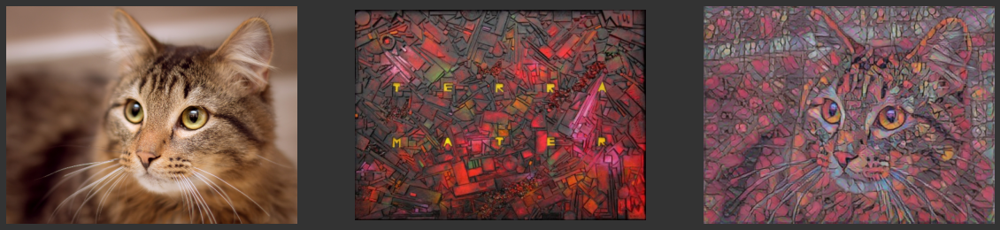

In [11]:
fig = plt.figure(figsize=(20, 12))
fig.patch.set_facecolor('0.2')
for i, elt in enumerate([main_content, main_style, stylized_image]):
  plt.subplot(1, 3, i+1)
  imshow(elt)
# Et voilà le résultat:

## Approche Manuelle

- On va utiliser le modèle VGG19 pré-entrainé sur ImageNet (1000 classes)

In [12]:
# On importe le modèle, puis prédictions sur l'image d'un lion.
input_ = tf.keras.applications.vgg19.preprocess_input(name2content['lion']*255)
input_ = tf.image.resize(input_, (224, 224))
vgg = tf.keras.applications.VGG19(include_top=True, weights='imagenet')
prediction_probabilities = vgg(input_)
print('Predictions-shape:', prediction_probabilities.shape)

574717952/574710816 [==============================] - 11s 0us/step
Predictions-shape: (1, 1000)


In [13]:
# Renvoie les 5 meilleures prédictions (par défault)
top_5 = tf.keras.applications.vgg19.decode_predictions(prediction_probabilities.numpy())[0]
for id, class_name, proba in top_5:
  print('{:7} {}'.format(class_name, proba))

40960/35363 [==================================] - 0s 0us/step
lion    0.9999908208847046
lynx    3.0645883271063212e-06
tiger   2.2815956981503405e-06
ox      1.109787945097196e-06
bison   7.381531190731039e-07


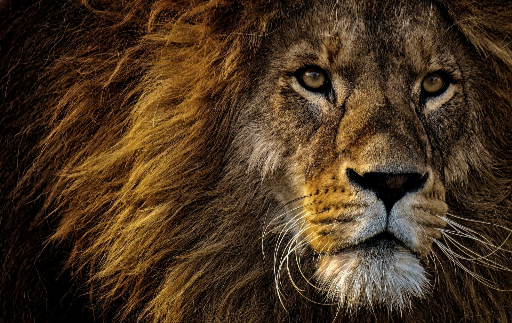

In [14]:
# VGG19 a parfaitement classé le lion.
tensor_to_image(name2content['lion'])

### Conception du modèle (à partir de VGG19)

- Cette partie consiste à 'capturer' les représentations de contenu et de style à partir des couches intermédiaires du VGG19.

In [15]:
# On importe le modèle VGG19 pré-entrainé sur la base ImageNet, 
# mais sans la couche supérieure de classification.
vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
list(layer.name for layer in vgg.layers)

80142336/80134624 [==============================] - 2s 0us/step


['input_2',
 'block1_conv1',
 'block1_conv2',
 'block1_pool',
 'block2_conv1',
 'block2_conv2',
 'block2_pool',
 'block3_conv1',
 'block3_conv2',
 'block3_conv3',
 'block3_conv4',
 'block3_pool',
 'block4_conv1',
 'block4_conv2',
 'block4_conv3',
 'block4_conv4',
 'block4_pool',
 'block5_conv1',
 'block5_conv2',
 'block5_conv3',
 'block5_conv4',
 'block5_pool']

In [16]:
# On choisit cette couche supérieure pour capturer : 
# --> le contenu de haut niveau de l'image d'entrée
# --> sa disposition spatiale, sans aller jusqu'au pixel près.
content_layers = ['block5_conv2'] 

# On choisit ces couches à différents niveaux pour capturer:
# --> des représentations à différentes échelles de l'image de style
# afin d'extraire la 'texture' mais sans l'arrangement global ('conv1')
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1']

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [17]:
def vgg_layers(layer_names):
  """Retourne les sorties de certaines couches intermédiaires de VGG19"""
  vgg = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
  # On rend les paramètres du vgg non entrainables:
  vgg.trainable = False
  # Sorties des couches (de style ou de contenu) choisies:
  outputs = [vgg.get_layer(name).output for name in layer_names]
  model = tf.keras.Model([vgg.input], outputs)
  return model

In [18]:
# L'extracteur fournit les représentations souhaitées de l'image d'entrée.
style_extractor = vgg_layers(style_layers)
# On récupère les représentations du lion.
style_outputs = style_extractor(name2content['lion']*255)
# On visualise la forme des sorties:
for name, output in zip(style_layers, style_outputs):
  print('{:15}{}'.format(name, output.shape))

block1_conv1   (1, 323, 512, 64)
block2_conv1   (1, 161, 256, 128)
block3_conv1   (1, 80, 128, 256)
block4_conv1   (1, 40, 64, 512)
block5_conv1   (1, 20, 32, 512)


### Matrice de Gram

- Ici, la gram_matrix prend un tenseur (la sortie d'une couche de conv) puis pour chaque paire de cartes de caractéristique, va faire une sorte de 'produit sclaire' (multiplication terme à terme des 2 cartes, et somme). On divise enfin par le nombre de termes de la carte (h*w).

In [19]:
def gram_matrix(input_tensor):
  # einsum --> Convention de sommation d'Einstein
  result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
  input_shape = tf.shape(input_tensor)
  # Nombre de termes d'une carte (hauteur*largeur), cast pour la division
  num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32) 
  return result/num_locations

In [20]:
class StyleContentModel(tf.keras.models.Model):
  def __init__(self, style_layers, content_layers):
    super(StyleContentModel, self).__init__()
    self.vgg = vgg_layers(style_layers + content_layers)
    self.style_layers = style_layers
    self.content_layers = content_layers
    self.num_style_layers = len(style_layers)
    self.vgg.trainable = False

  def call(self, inputs):
    "Les entrées doivent être comprises dans [0, 1]"
    inputs = inputs*255.0
    preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
    # outputs contient les représentations de style et de contenu
    outputs = self.vgg(preprocessed_input)
    style_outputs, content_outputs = (outputs[:self.num_style_layers],
                                      outputs[self.num_style_layers:])
    # Matrice de Gram seulement pour le style
    style_outputs = [gram_matrix(style_output)
                     for style_output in style_outputs]

    content_dict = {content_name: value
                    for content_name, value
                    in zip(self.content_layers, content_outputs)}

    style_dict = {style_name: value
                  for style_name, value
                  in zip(self.style_layers, style_outputs)}

    return {'content': content_dict, 'style': style_dict}

In [21]:
# On définit notre extracteur..
extractor = StyleContentModel(style_layers, content_layers)
# On récupère le contenu et les représentation de style finales (Gram)
results = extractor(tf.constant(name2content['lion']))

print('Style:')
for name, gram in results['style'].items():
  print(' {:15}{}'.format(name, gram.numpy().shape))

print('\nContent:')
for name, output in sorted(results['content'].items()):
  print(' {:15}{}'.format(name, output.numpy().shape))
# On observe bien que la matrice Gram renvoie des matrices symétriques

Style:
 block1_conv1   (1, 64, 64)
 block2_conv1   (1, 128, 128)
 block3_conv1   (1, 256, 256)
 block4_conv1   (1, 512, 512)
 block5_conv1   (1, 512, 512)

Content:
 block5_conv2   (1, 20, 32, 512)


### Implémentation de la descente de Gradient

- Definition des variables, hyperparamètres etc...

In [22]:
main_content = name2content['lion']
main_style = name2style['volcan']

# On récupère les représentations de style de l'image de style..volcan
style_targets = extractor(main_style)['style']
# et la représentation de contenu de l'image de contenu 
content_targets = extractor(main_content)['content']

In [23]:
# On initialise notre variable avec l'image de contenu
var_image = tf.Variable(main_content)
opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)
# Poids conseillés (de contenu et de style) --> hyperparamètres clés
style_weight = 1e-2
content_weight = 1e4

- Fonctions de perte et d'entrainement

In [24]:
# Juste pour saturer les valeurs à [0, 1]
# Attention, partial(functools) ne fonctionne pas avec @tf.function
def clip_0_1(image_input):
  return tf.clip_by_value(image_input, clip_value_min=0.0, clip_value_max=1.0)

In [25]:
def style_content_loss(outputs):
    # On réceptionne les représentations dans sortie du modèle après appel
    style_outputs = outputs['style']
    content_outputs = outputs['content']
    
    # (tf.add_n --> ajout de tenseurs elt par elt) et somme des mse
    style_loss = tf.add_n([tf.reduce_mean((style_outputs[name]-style_targets[name])**2) 
                           for name in style_outputs.keys()])
    # On fait la moyenne sur l'ensemble des couches et on multiplie par le poids:
    style_loss *= style_weight / num_style_layers
    
    # Idem pour le contenu:
    content_loss = tf.add_n([tf.reduce_mean((content_outputs[name]-content_targets[name])**2) 
                             for name in content_outputs.keys()])
    content_loss *= content_weight / num_content_layers
    loss = style_loss + content_loss
    return loss

In [26]:
@tf.function()
def train_step(image_input):
  with tf.GradientTape() as tape:
    outputs = extractor(image_input)
    loss = style_content_loss(outputs)
  # Les paramètres entrainables = notre image d'entrée
  grad = tape.gradient(loss, image_input)
  opt.apply_gradients([(grad, image_input)])
  # Attention à bien 'saturer' image_input à [0, 1] pour l'étape suivante
  image_input.assign(clip_0_1(image_input))

### Entrainement

In [27]:
import IPython.display as display

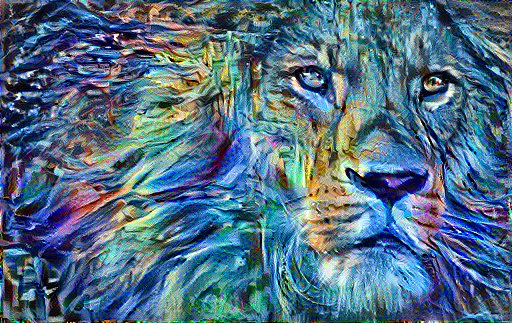

Train step: 1000


In [28]:
epochs = 10
steps_per_epoch = 100

total_steps = 0
for epoch in range(epochs):
  for step in range(steps_per_epoch):
    total_steps += 1
    train_step(var_image)
    print(".", end='')
  # Attend qu'une nouvelle image remplace celle en cours
  display.clear_output(wait=True)
  display.display(tensor_to_image(var_image))
  print("Train step: {}".format(total_steps))

- Cet implémentation produit des artefacts haute-fréquence qui rendent l'image anguleuse. 
- Si besoin il existe une 'perte de variation totale' pour y remédier.

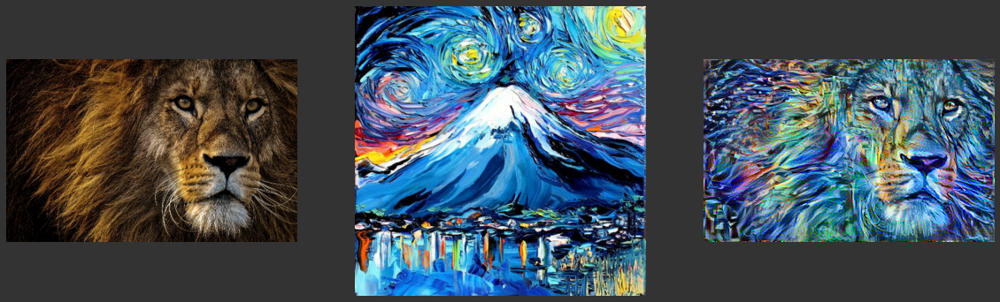

In [29]:
fig = plt.figure(figsize=(20, 12))
fig.patch.set_facecolor('0.2')
for i, elt in enumerate([main_content, main_style, var_image]):
  plt.subplot(1, 3, i+1)
  imshow(elt)
  # Et voilà !

## Bonus de fin

In [30]:
style_names = [name.split('.')[0] for name in style_names]

In [31]:
def art_generator(content_image, style_names):
  styles = []
  for name in style_names:
    stylized = hub_model(tf.constant(content_image), tf.constant(name2style[name]))[0]
    styles.append(stylized)
  return styles

### Tribu

In [32]:
content = name2content['tribu']
names = 'volcan bois3 mer terra fluide karl mosaique'.split()
style_collections = art_generator(content, names)

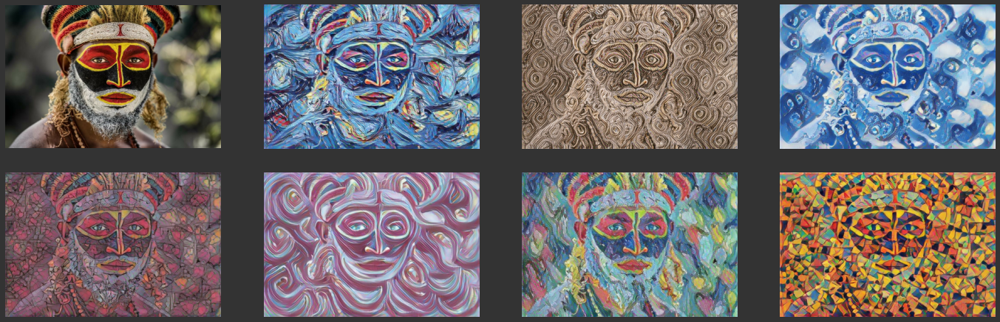

In [33]:
fig = plt.figure(figsize=(24, 8))
fig.patch.set_facecolor('0.2')
fig.subplots_adjust(hspace=0.1)
plt.subplot(2, 4, 1)
imshow(content)
for i, elt in enumerate(style_collections):
  plt.subplot(2, 4, i+2)
  imshow(elt)

### Chat

In [34]:
content = name2content['chat']
names = 'palmier craquelure volcan bois2 bois3 mer terra fluide resine karl mosaique'.split()
style_collections = art_generator(content, names)

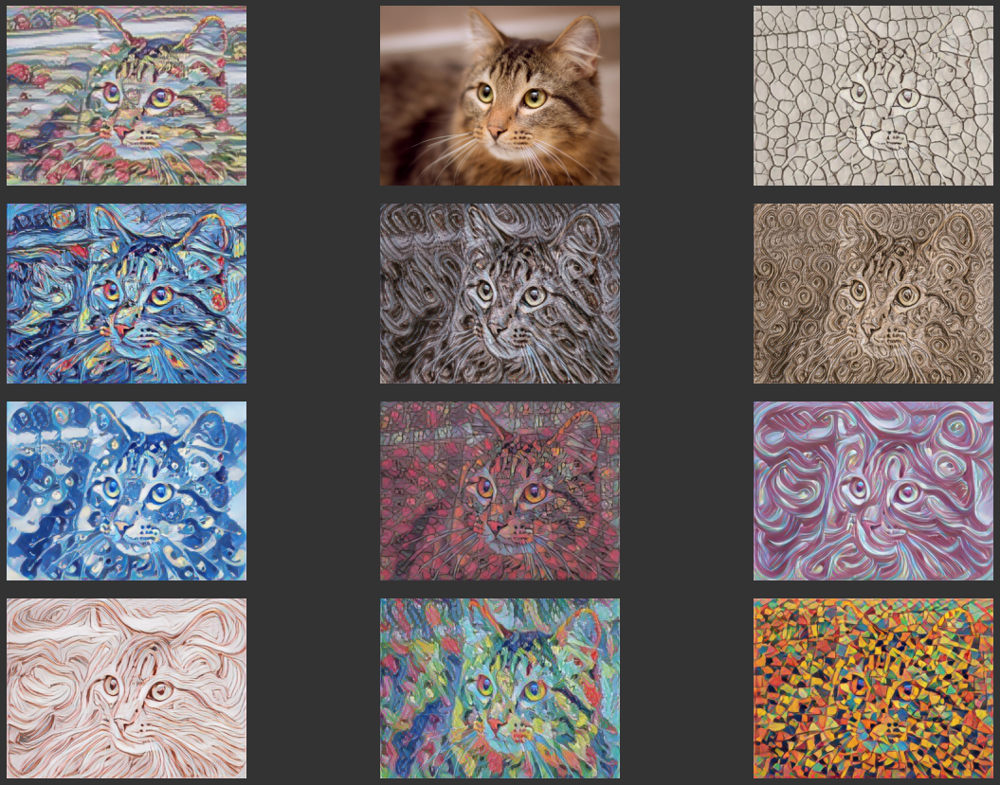

In [35]:
fig = plt.figure(figsize=(20, 15))
fig.patch.set_facecolor('0.2')
fig.subplots_adjust(hspace=0.1)
plt.subplot(4, 3, 1)
imshow(style_collections[0])
plt.subplot(4, 3, 2)
imshow(content)
plt.subplot(4, 3, 3)
imshow(style_collections[1])
for i in range(2, 11):
  plt.subplot(4, 3, i+2)
  imshow(style_collections[i])

### San Francisco

In [36]:
content = name2content['SF']
names = 'palmier joconde arbres immeuble volcan mer terra karl'.split()
style_collections = art_generator(content, names)

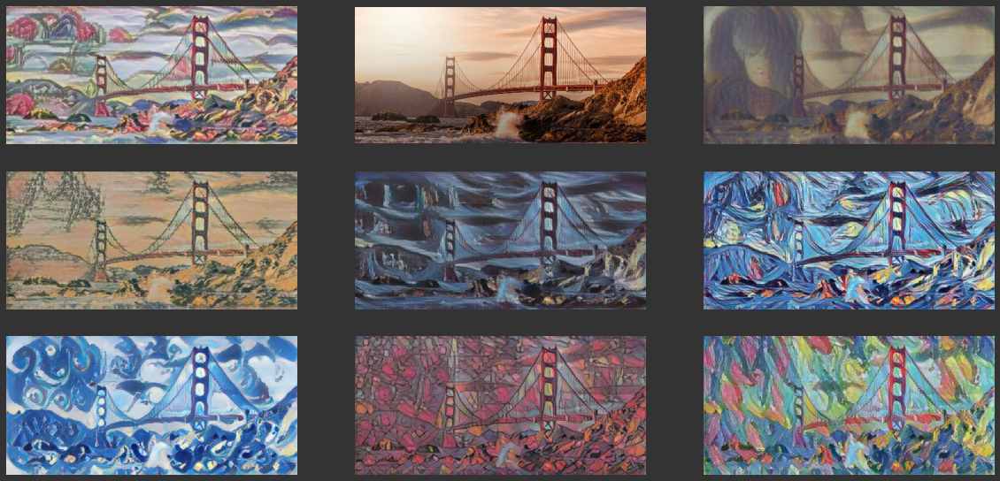

In [37]:
fig = plt.figure(figsize=(20, 10))
fig.patch.set_facecolor('0.2')
fig.subplots_adjust(hspace=0.1)
plt.subplot(3, 3, 1)
imshow(style_collections[0])
plt.subplot(3, 3, 2)
imshow(content)
plt.subplot(3, 3, 3)
imshow(style_collections[1])
for i in range(2, 8):
  plt.subplot(3, 3, i+2)
  imshow(style_collections[i])

### New York

In [38]:
content = name2content['NY']
names = 'palmier volcan joconde arbres immeuble'.split()
style_collections = art_generator(content, names)

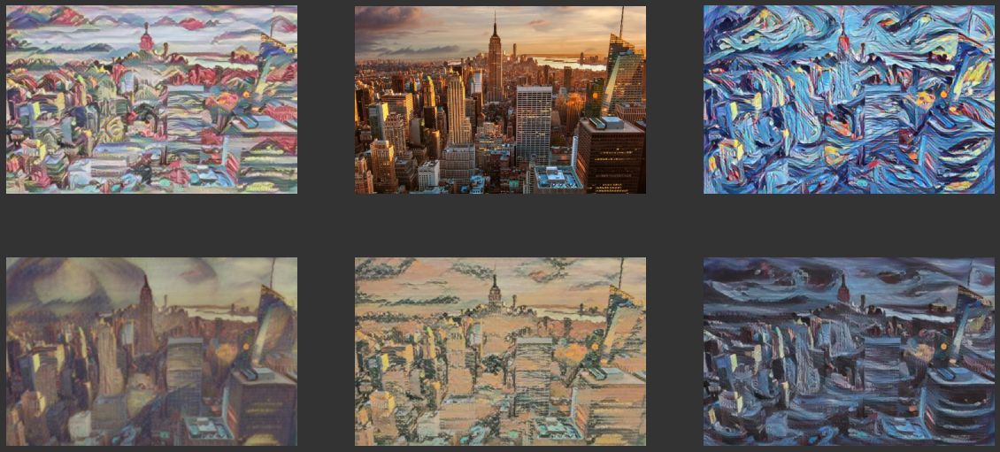

In [39]:
fig = plt.figure(figsize=(20, 10))
fig.patch.set_facecolor('0.2')
fig.subplots_adjust(hspace=0.1)
plt.subplot(2, 3, 1)
imshow(style_collections[0])
plt.subplot(2, 3, 2)
imshow(content)
plt.subplot(2, 3, 3)
imshow(style_collections[1])
for i in range(2, 5):
  plt.subplot(2, 3, i+2)
  imshow(style_collections[i])

### Maison paille

In [40]:
content = name2content['paille']
names = 'palmier volcan immeuble terra karl'.split()
style_collections = art_generator(content, names)

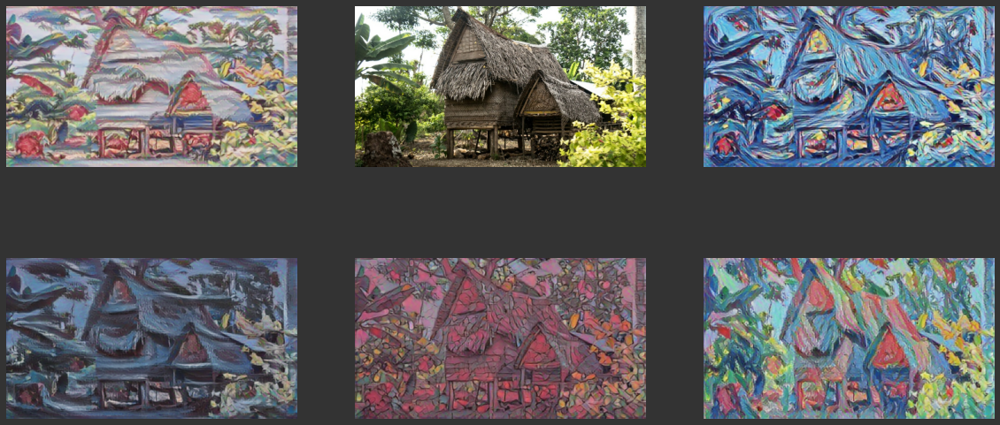

In [41]:
fig = plt.figure(figsize=(20, 10))
fig.patch.set_facecolor('0.2')
fig.subplots_adjust(hspace=0.1)
plt.subplot(2, 3, 1)
imshow(style_collections[0])
plt.subplot(2, 3, 2)
imshow(content)
plt.subplot(2, 3, 3)
imshow(style_collections[1])
for i in range(2, 5):
  plt.subplot(2, 3, i+2)
  imshow(style_collections[i])

### Lion

In [42]:
content = name2content['lion']
names = 'palmier terra mer arbres bois2 bois3 karl fluide'.split()
style_collections = art_generator(content, names)

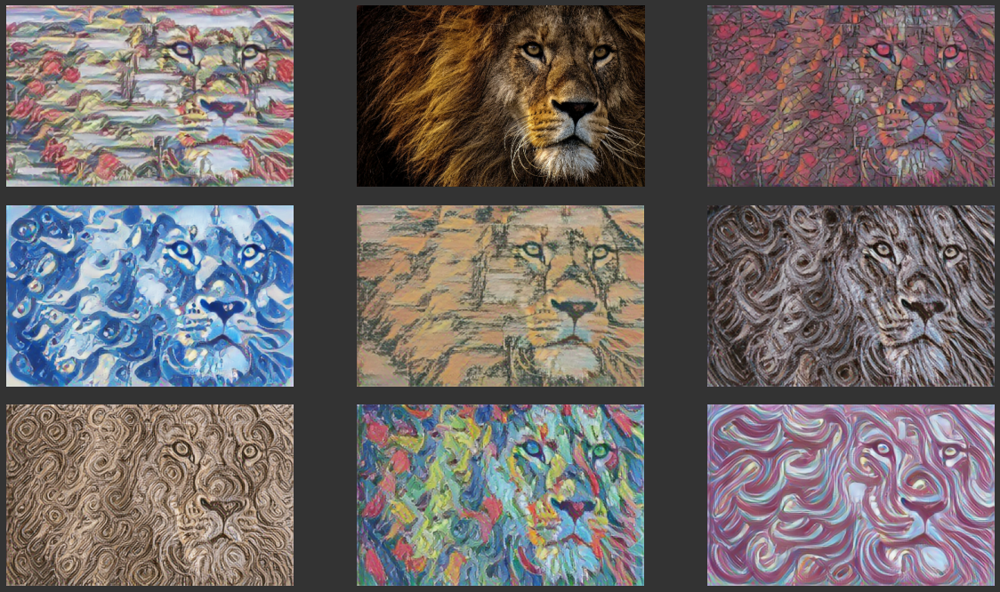

In [43]:
fig = plt.figure(figsize=(20, 12))
fig.patch.set_facecolor('0.2')
fig.subplots_adjust(hspace=0.1)
plt.subplot(3, 3, 1)
imshow(style_collections[0])
plt.subplot(3, 3, 2)
imshow(content)
plt.subplot(3, 3, 3)
imshow(style_collections[1])
for i in range(2, 8):
  plt.subplot(3, 3, i+2)
  imshow(style_collections[i])

### Tour Eiffel

In [44]:
content = name2content['paris']
names = 'palmier joconde immeuble volcan bois3 mer terra resine karl'.split()
style_collections = art_generator(content, names)

In [45]:
fig = plt.figure(figsize=(22, 15))
fig.patch.set_facecolor('0.2')
fig.subplots_adjust(hspace=0.1)
plt.subplot(2, 5, 3)
imshow(content)
for i, indice in enumerate([1, 2] + list(range(4, 11))):
  plt.subplot(2, 5, indice)
  imshow(style_collections[i])

Output hidden; open in https://colab.research.google.com to view.

### Barque

In [47]:
content = name2content['barque']
names = 'joconde immeuble arbres terra mer volcan karl bois3 bois2 palmier resine'.split()
style_collections = art_generator(content, names)

In [48]:
fig = plt.figure(figsize=(20, 16))
fig.patch.set_facecolor('0.2')
fig.subplots_adjust(hspace=0.1)
plt.subplot(4, 3, 1)
imshow(style_collections[0])
plt.subplot(4, 3, 2)
imshow(content)
plt.subplot(4, 3, 3)
imshow(style_collections[1])
for i in range(2, 11):
  plt.subplot(4, 3, i+2)
  imshow(style_collections[i])

Output hidden; open in https://colab.research.google.com to view.

- Fin du notebook